In [2]:
import random
import cv2
from matplotlib import pyplot as plt
import albumentations as A

def visualize(image,bboxes=None):
    if bboxes is not None:
        for bbox in bboxes:
            obj_class, x_min, y_min, x_max, y_max = yolo_2_Albumentations_bbox(bbox, image.shape[1], image.shape[0]) #transform to Pascal VOC format
            if obj_class == 0:
                image = cv2.rectangle(image.copy(), (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)  # Green color, 2 px thickness
            else:
                image = cv2.rectangle(image.copy(), (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)  # Red color, 2 px thickness

    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)
    plt.show()

def yolo_2_Albumentations_bbox(yolo_bbox, width, height):
    obj_class, x_center, y_center, bbox_width, bbox_height = yolo_bbox
    x_min = int((x_center - bbox_width / 2) * width)
    x_max = int((x_center + bbox_width / 2) * width)
    y_min = int((y_center - bbox_height / 2) * height)
    y_max = int((y_center + bbox_height / 2) * height)
    return obj_class, x_min, y_min, x_max, y_max

def open_bboxes_txt(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        obj_class = int(parts[0])
        x_center, y_center, bbox_width, bbox_height = map(float, parts[1:5])
        yolo_bbox = obj_class, x_center, y_center, bbox_width, bbox_height
        
        bboxes.append(yolo_bbox)
    return bboxes

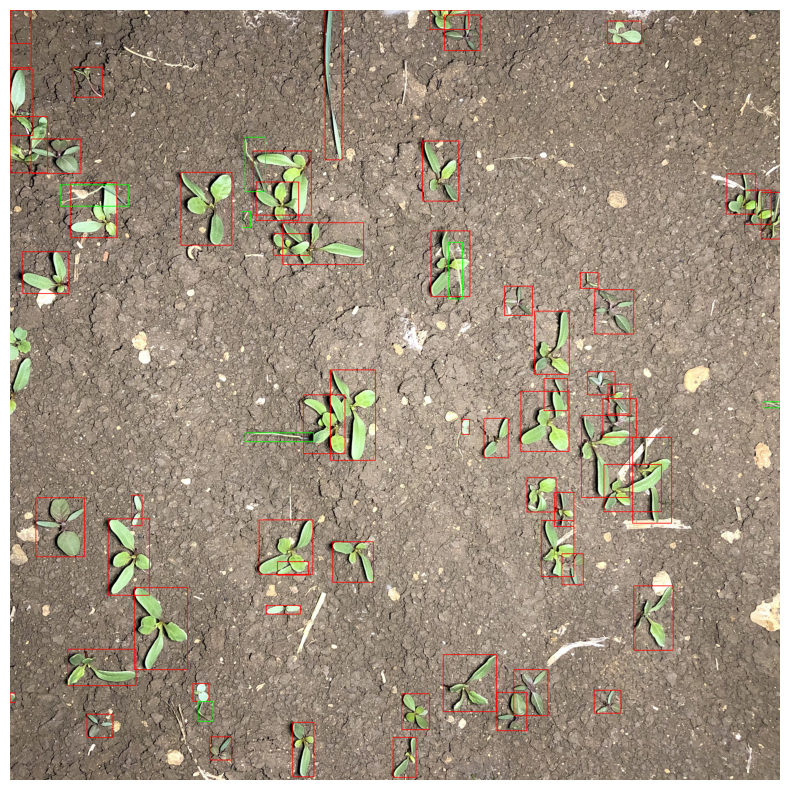

In [3]:
image = cv2.imread('Data\luxeed_heatmaps\data\images\IMG_2167.JPG')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
bboxes = open_bboxes_txt('Data\luxeed_heatmaps\data\labels\IMG_2167.txt')
class_labels = [bbox[0] for bbox in bboxes]
bboxes_only = [bbox[1:] for bbox in bboxes]
visualize(image, bboxes)

c:\Users\yurim\anaconda3\Lib\site-packages\albumentations\core\composition.py:205: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


Original image and bounding boxes


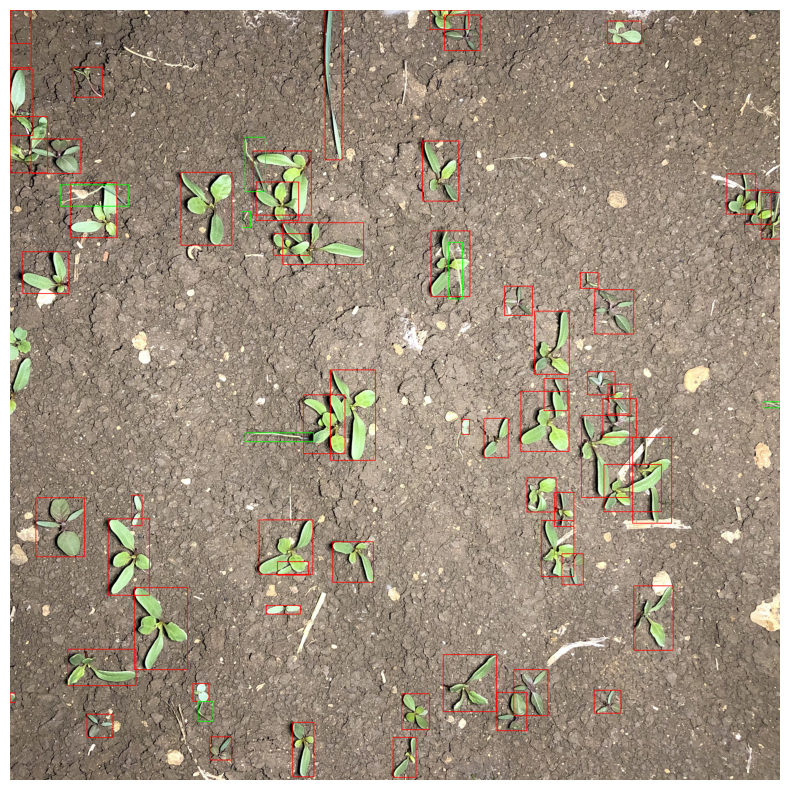

Applying transformation: HorizontalFlip


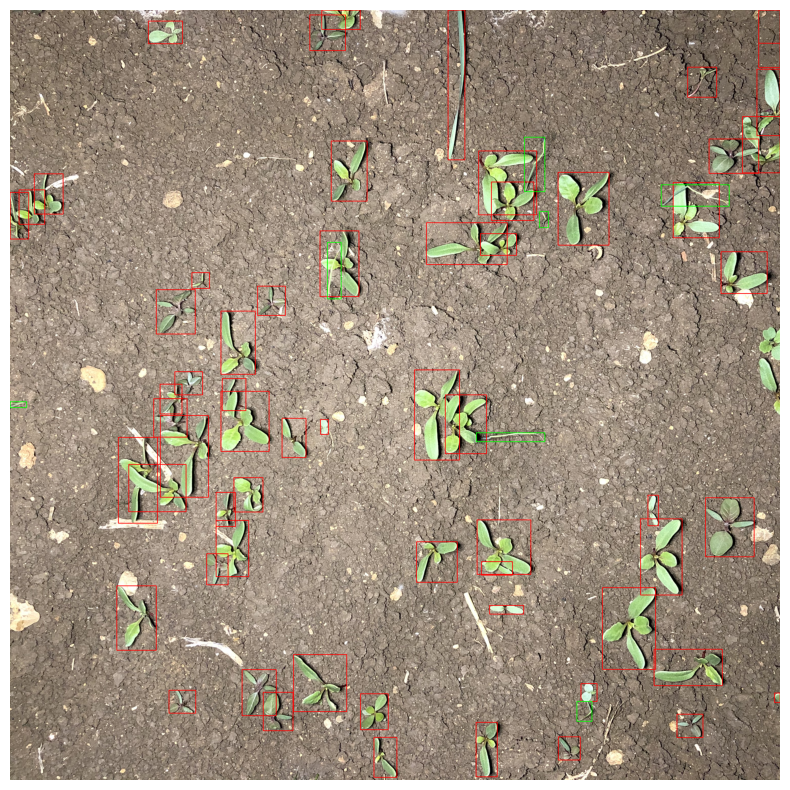

Applying transformation: Scale


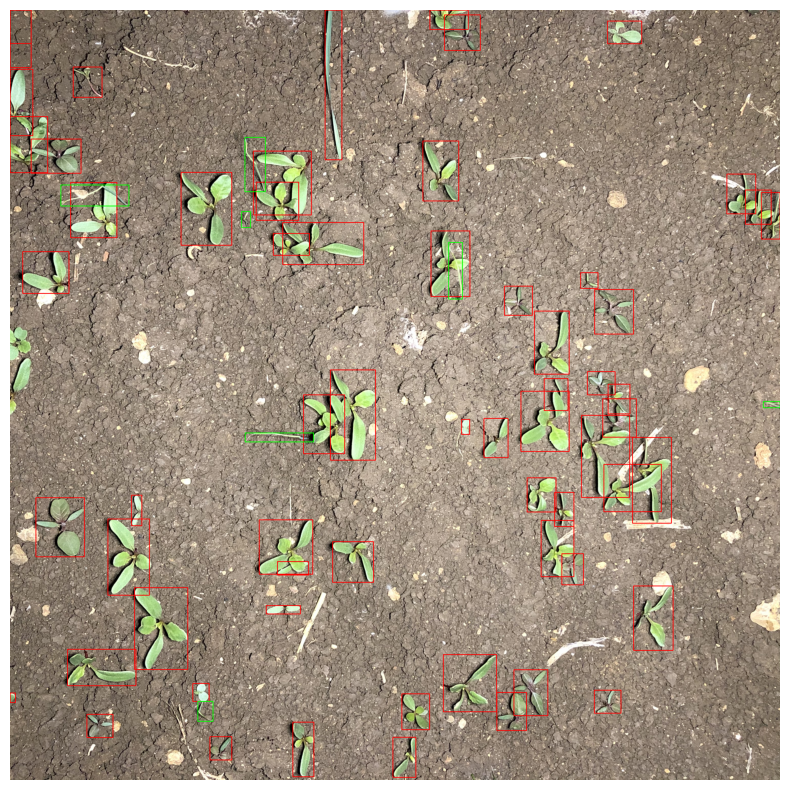

Applying transformation: AddNoise


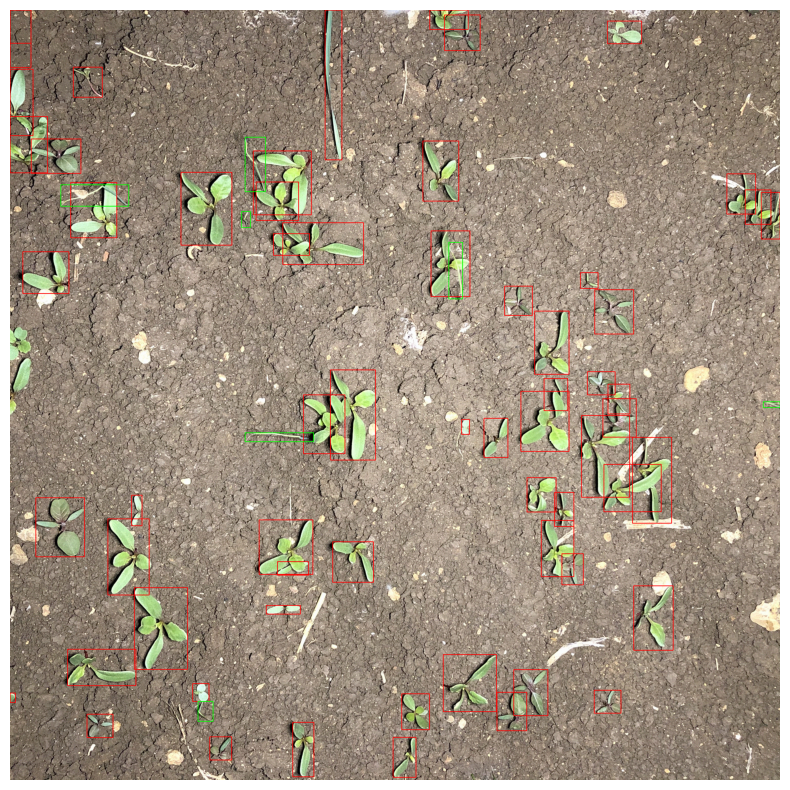

Applying transformation: Rotate


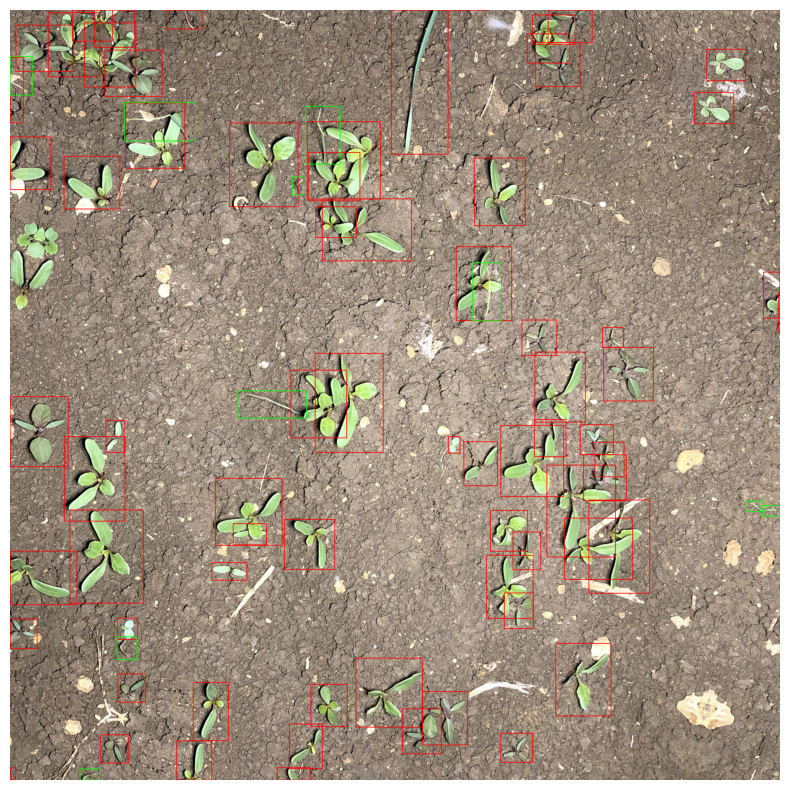

c:\Users\yurim\anaconda3\Lib\site-packages\albumentations\core\bbox_utils.py:478: RuntimeWarning: invalid value encountered in divide
  & (clipped_box_areas / denormalized_box_areas >= min_visibility - epsilon)


Applying transformation: Zoom


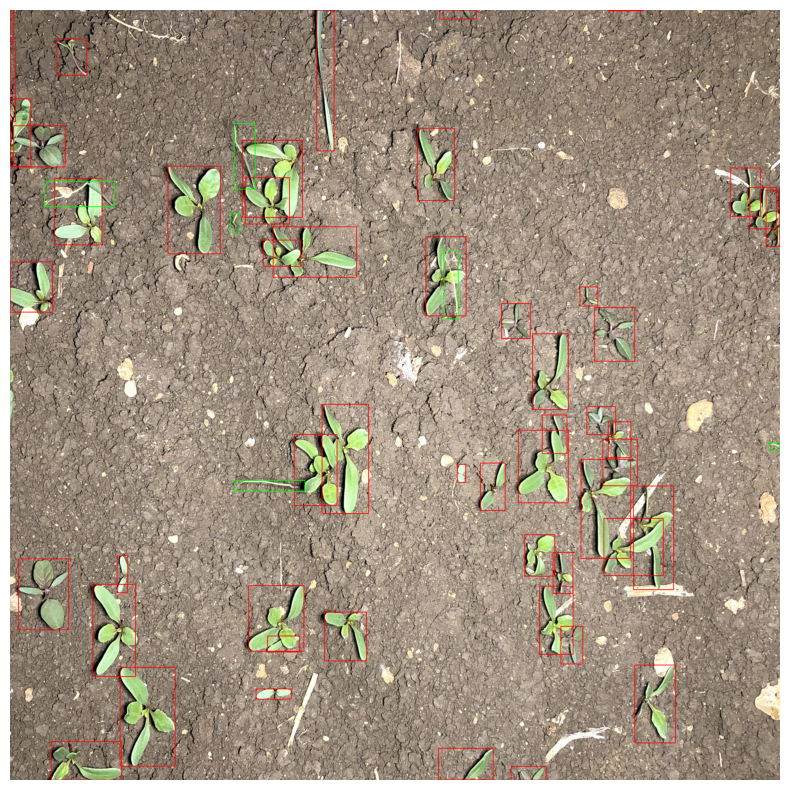

Applying transformation: Shift


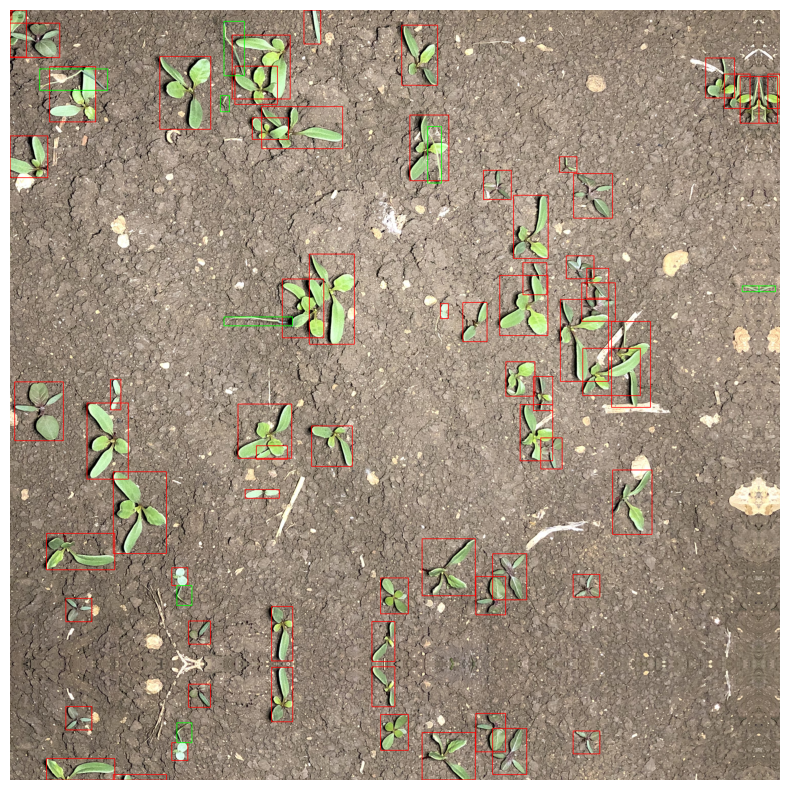

Applying transformation: BrightnessVariation


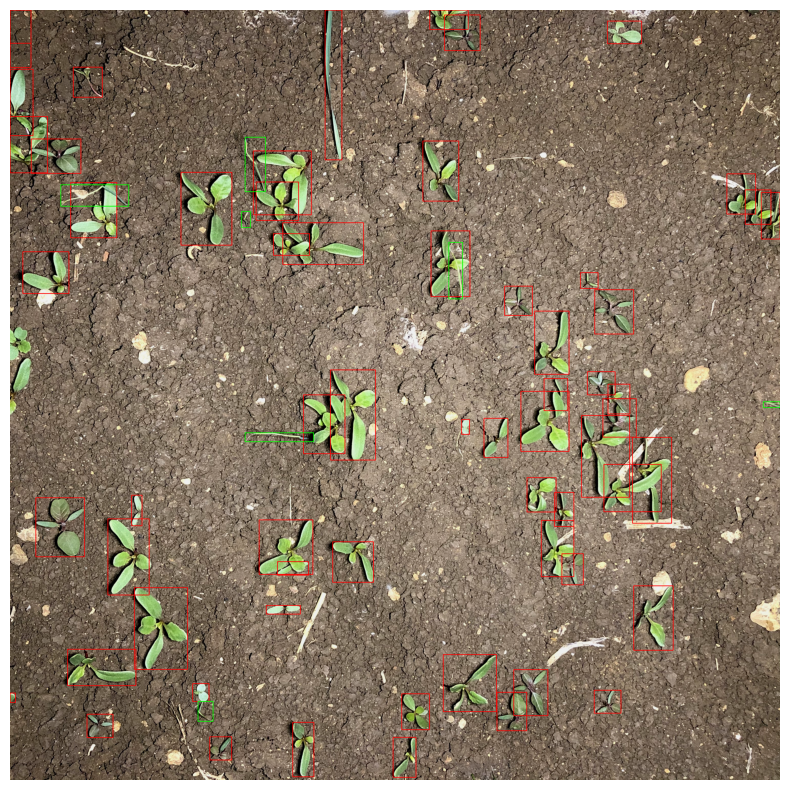

In [4]:
# Define a list of transformations to apply one at a time
transformations = {
    "HorizontalFlip": A.Compose(
        [A.HorizontalFlip(p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "Scale": A.Compose(
        [A.RandomScale(scale_limit=0.2, p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "AddNoise": A.Compose(
        [A.GaussNoise(var_limit=(10.0, 50.0), p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "Rotate": A.Compose(
        [A.Rotate(limit=45, p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "Zoom": A.Compose(
        [A.RandomResizedCrop(height=image.shape[0], width=image.shape[1], scale=(0.8, 1.0), p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "Shift": A.Compose(
        [A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0, rotate_limit=0, p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    ),
    "BrightnessVariation": A.Compose(
        [A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1)],
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    )
}

# Set the seed for reproducibility
random.seed(420)

print("Original image and bounding boxes")
visualize(image, bboxes)

# Apply each transformation and visualize
for name, transform in transformations.items():
    # Apply the transformation
    augmented = transform(image=image, bboxes=bboxes_only, class_labels=class_labels)

    # Extract augmented image and bounding boxes
    augmented_image = augmented['image']
    augmented_bboxes = augmented['bboxes']
    augmented_class_labels = augmented['class_labels']

    # Combine class labels with bounding boxes
    augmented_bboxes_with_labels = [
        [augmented_class_labels[i]] + list(bbox) for i, bbox in enumerate(augmented_bboxes)
    ]

    # Visualize the transformation result
    print(f"Applying transformation: {name}")
    visualize(augmented_image, augmented_bboxes_with_labels)

C:\Users\yurim\AppData\Local\Temp\ipykernel_14104\3939115384.py:3: DeprecationWarning: Flip is deprecated. Consider using HorizontalFlip, VerticalFlip, RandomRotate90 or D4.
  A.Flip(),


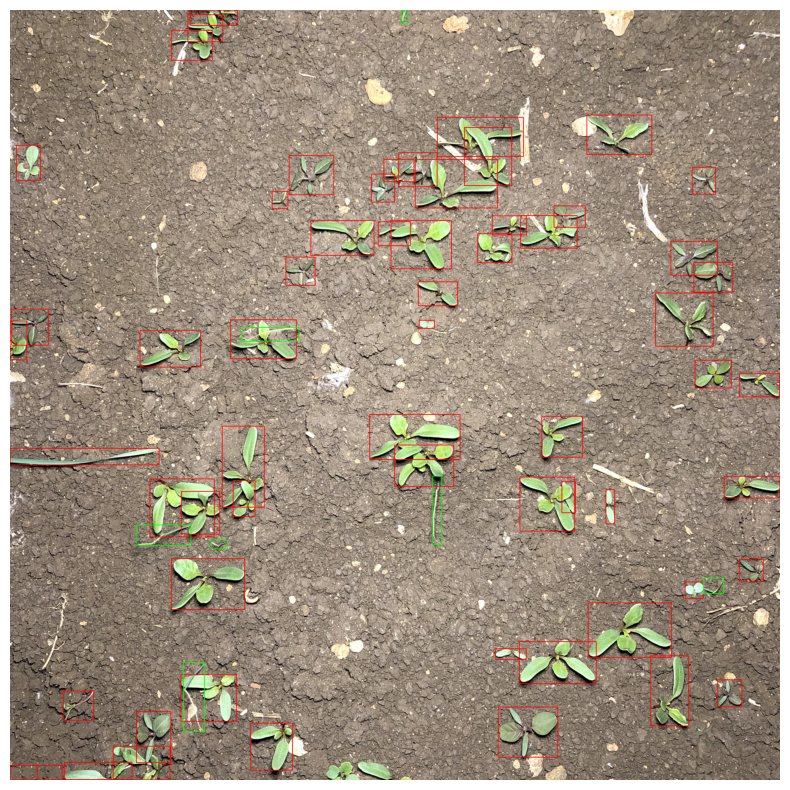

In [5]:
transform = A.Compose([
    A.RandomRotate90(),
    A.Flip(),
    A.Transpose(),
    A.GaussNoise(),
    A.OneOf([
        A.MotionBlur(p=.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
    A.OneOf([
        A.OpticalDistortion(p=0.3),
        A.GridDistortion(p=.1),
    ], p=0.2),
    A.OneOf([
        A.CLAHE(clip_limit=2),
        A.RandomBrightnessContrast(),
    ], p=0.3),
    A.HueSaturationValue(p=0.3),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
random.seed(7)

augmented = transform(image=image, bboxes=bboxes_only, class_labels=class_labels)
augmented_image = augmented['image']
augmented_bboxes = augmented['bboxes']
augmented_class_labels = augmented['class_labels']

augmented_bboxes_with_labels = [[augmented_class_labels[i]] + list(bbox) for i, bbox in enumerate(augmented_bboxes)]

visualize(augmented_image, augmented_bboxes_with_labels)